In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import sys
sys.path.append('..')

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import torch
import torch.nn.functional as F
import xarray as xr

from src.datasets import (SpaceNet7PlanetScopeDataset as PlanetDataset,
                          SpaceNet7SentinelDataset as SentinelDataset)
from src.datamodules import SN7DataModule
from src.datasources import spacenet7_index, S2_BANDS
from src.datautils import dilate, Sampler2d, Compose4d, ToTensor2
from src.plot import show

In [11]:
date_range = pd.date_range(start=f"2020-01-28", end=f"2020-01-31")
dataset_sentinel = SentinelDataset(date_range=date_range, bands=S2_BANDS['true_color'], samples=90, random_seed=42, window_size=64)

In [12]:
print(dataset_sentinel)

split train
sat sentinel
start 2020-01-28, end 2020-01-31
scenes 33, samples 90
labels False
window_size 64
transform None
random_seed 42
data_dir /data/spacenet/train/



In [13]:
date_range = pd.date_range(start=f"2020-01-28", end=f"2020-01-31")
dm_sentinel = SN7DataModule(mode='sentinel', s2_bands=S2_BANDS['true_color'], window_size_s2=64, date_range=date_range, samples=90)
dm_sentinel.setup()

In [14]:
patches = [(p[0], str(p[1])) for p in dm_sentinel.dataset_all.patches]
unique_patches = set([(p[0], str(p[1])) for p in dm_sentinel.dataset_all.patches])
assert len(patches) == len(unique_patches)

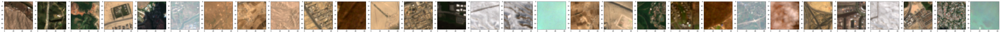

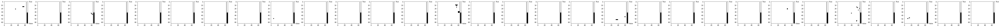

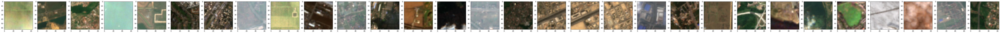

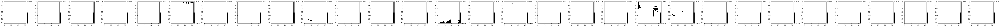

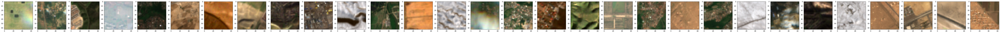

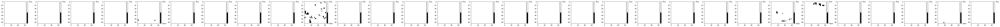

In [16]:
images = [x['images'][[0]] for x in dm_sentinel.dataset_all]
clouds = [x['clouds'][0] for x in dm_sentinel.dataset_all]
clear_masks = [dm_sentinel.dataset_all.clearance_masks(x) for x in clouds]

for i in range(3):
    show(images[i*30:(i+1)*30])
    #show(clouds[i*30:(i+1)*30], colorbar=False)
    show(clear_masks[i*30:(i+1)*30], colorbar=True)

---

In [17]:
# date_range = pd.date_range(start=f"2019-11-01", end=f"2020-01-31")
# dm = SN7DataModule(mode='concat', s2_bands=S2_BANDS['true_color'], window_size_s2=64, date_range=date_range)
# dm.setup()

In [3]:
date_range = pd.date_range(start=f"2019-11-01", end=f"2020-01-31")
dataset_sentinel = SentinelDataset(train_val_test='val', date_range=date_range,
                                   bands=S2_BANDS['true_color'], samples=90, window_size=64, random_seed=42)

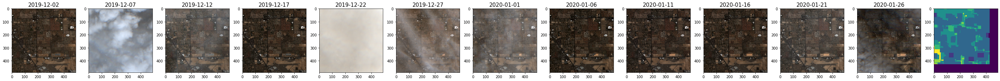

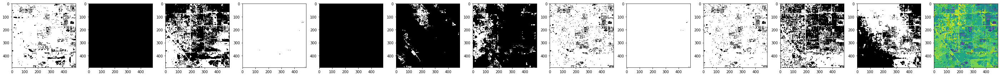

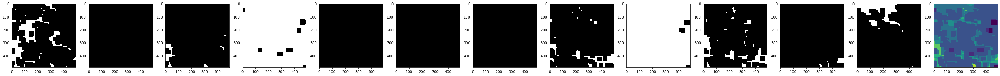

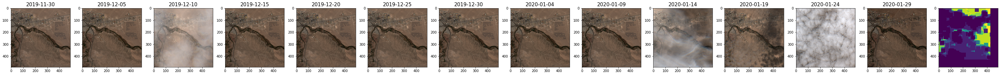

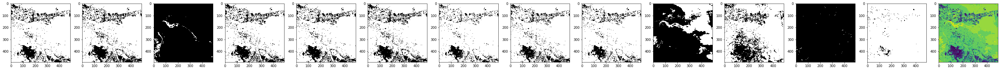

...

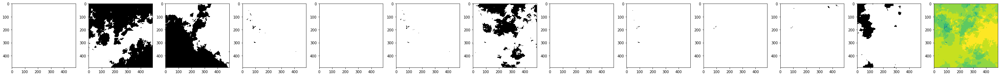

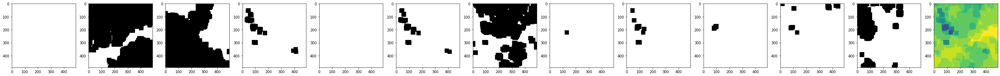

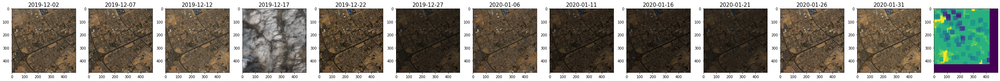

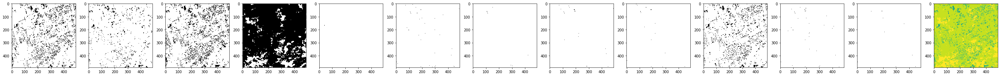

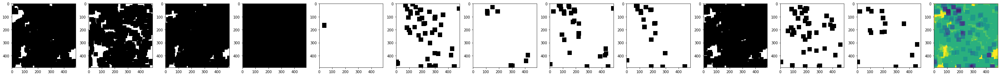

In [32]:
for s in dataset_sentinel.scenes:
    show([dataset_sentinel[s]['images'], dataset_sentinel.xarrays_clearance_prob[s]])
    show([dataset_sentinel.clearance_masks(dataset_sentinel[s]['clouds']),
          dataset_sentinel.clearance_masks(dataset_sentinel[s]['clouds']).sum(axis=0)])
    show([~dilate(~dataset_sentinel.clearance_masks(dataset_sentinel[s]['clouds']).numpy(), iterations=16),
          (~dilate(~dataset_sentinel.clearance_masks(dataset_sentinel[s]['clouds']).numpy(), iterations=16)).sum(axis=0)])

# Without and with `sample_by_clearance`

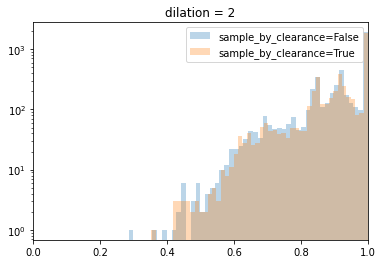

In [8]:
date_range = pd.date_range(start=f"2019-11-01", end=f"2020-01-31")
dataset_sentinel = SentinelDataset(train_val_test='train', date_range=date_range,
                                   bands=S2_BANDS['true_color'], samples=5000, window_size=64, random_seed=42)

clouds = [x['clouds'] for x in dataset_sentinel]
plt.hist([dataset_sentinel.clearance_masks(c).values.mean() for c in clouds], 50, label='sample_by_clearance=False', alpha=.3);
plt.xlim(0, 1); plt.yscale('log');

dataset_sentinel = SentinelDataset(train_val_test='train', date_range=date_range, 
                                   bands=S2_BANDS['true_color'], samples=5000, window_size=64, random_seed=42,
                                   sample_by_clearance=True)

clouds = [x['clouds'] for x in dataset_sentinel]
plt.hist([dataset_sentinel.clearance_masks(c).values.mean() for c in clouds], 50, label='sample_by_clearance=True', alpha=.3);
plt.xlim(0, 1); plt.yscale('log'); plt.legend(); plt.title('dilation = 2');

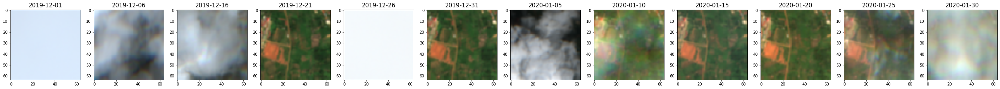

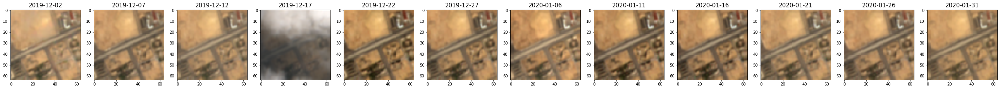

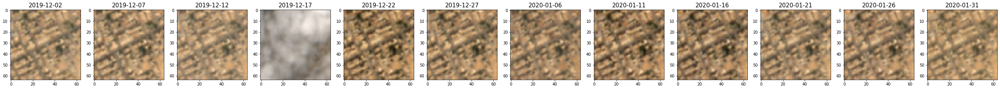

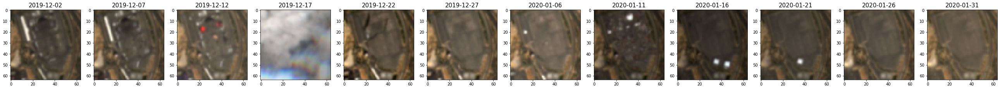

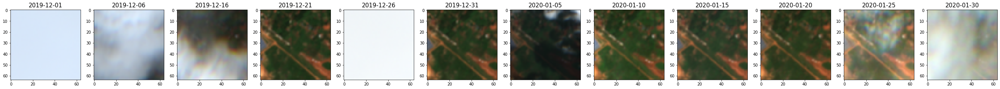

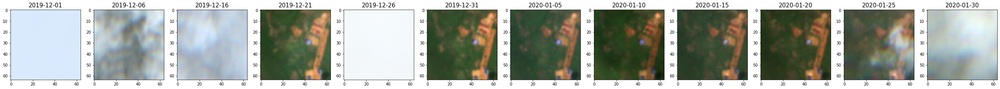

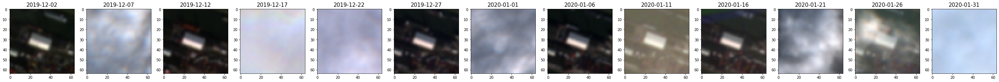

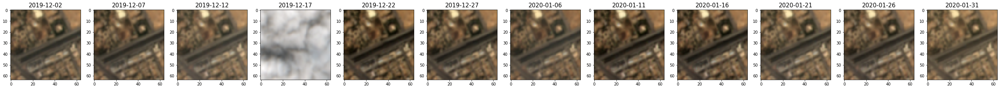

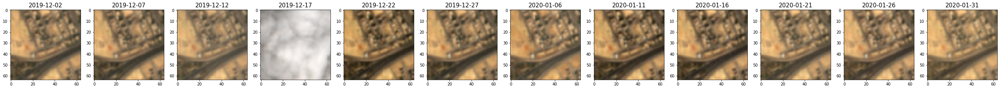

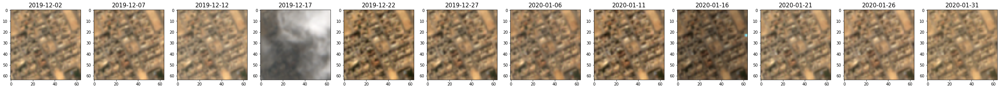

In [47]:
date_range = pd.date_range(start=f"2019-11-01", end=f"2020-01-31")
dataset_sentinel = SentinelDataset(train_val_test='val', date_range=date_range,
                                   bands=S2_BANDS['true_color'], samples=10, window_size=64, random_seed=42)

images = [x['images'] for x in dataset_sentinel]
clouds = [x['clouds'] for x in dataset_sentinel]
clear_masks = [dataset_sentinel.clearance_masks(x) for x in clouds]

for image in images:
    show(image)
#     show(images[i*30:(i+1)*30])
#     show(clouds[i*30:(i+1)*30], colorbar=False)
#     show(clear_masks[i*30:(i+1)*30], colorbar=True)

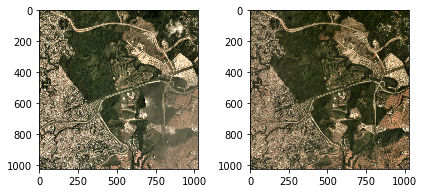

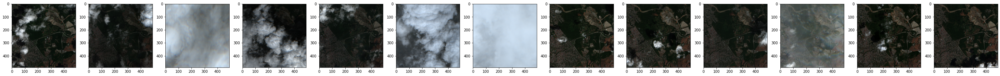

In [14]:
show(dm.dataset_all['L15-0571E-1075N_2287_3888_13']['highres']['images'])
show(dm.dataset_all['L15-0571E-1075N_2287_3888_13']['lowres']['images'])

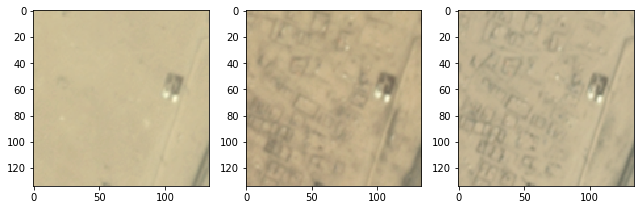

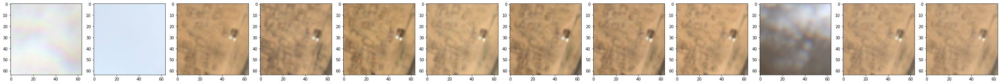

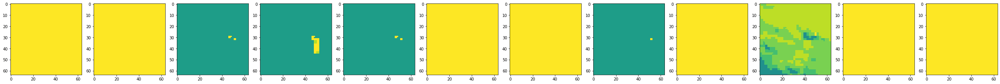

In [56]:
i = 10
show(dm.dataset_train[i]['highres']['images'])
show(dm.dataset_train[i]['lowres']['images'])
show(dm.dataset_train[i]['lowres']['clouds'])

---

In [4]:
# date_range = pd.date_range(start=f"2019-11-01", end=f"2020-01-31")

# dm = SN7DataModule(date_range=date_range, window_size=200, samples=10_000, batch_size=1, s2_bands=S2_BANDS['true_color'])
# dm.setup()

In [59]:
P = dm.dataset_train.dataset_planet[0]
S = dm.dataset_train.dataset_sentinel[0]

print(P,'\n')
print(S)

scene L15-1204E-1204N_4819_3372_13
revisits 3
dates ['2019-11-01', '2019-12-01', '2020-01-01']
images (3, 3, 134, 134)
clouds (3, 1, 134, 134)
labels None
clearances [1.0, 1.0, 1.0]
band means [156.42, 134.81, 99.69] 

scene L15-1204E-1204N_4819_3372_13
revisits 13
dates ['2019-11-30', '2019-12-05', '2019-12-10', '2019-12-15', '2019-12-20', '2019-12-25', '2019-12-30', '2020-01-04', '2020-01-09', '2020-01-14', '2020-01-19', '2020-01-24', '2020-01-29']
images (13, 3, 64, 64)
clouds (13, 1, 64, 64)
labels None
clearances [0.16, 1.0, 1.0, 1.0, 1.0, 0.99, 1.0, 0.94, 0.02, 1.0, 1.0, 1.0, 1.0]
band means [2958.26, 2448.56, 1959.09]


# Sampling of patches conditional on clearance

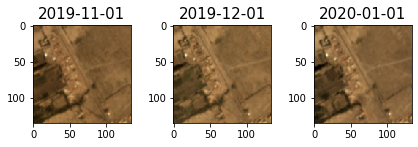

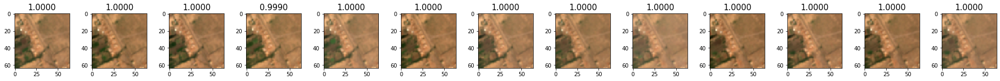

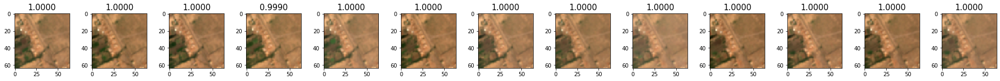

In [64]:
for i in [1]:
    P = dm.dataset_train.dataset_planet[i]
    S = dm.dataset_train.dataset_sentinel[i]
    show(P['images'], figsize=2)
    mask = dm.dataset_train.dataset_sentinel.clearance_masks(S['clouds']).numpy()
    mask = dilate(mask, iterations=15)
    show(S['images'], title=S['clearances'], figsize=2)
    show(S['images'] * mask, title=S['clearances'], figsize=2)

Dilate mask

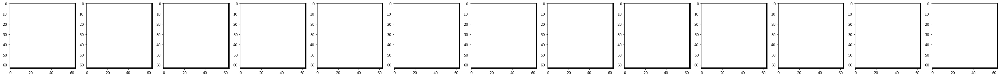

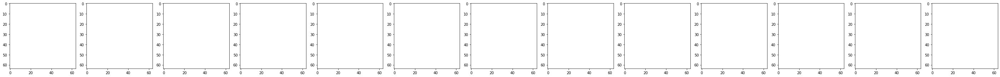

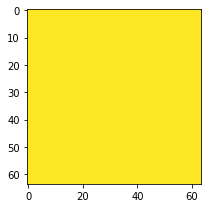

In [65]:
window_size = 32

mask[:, :, -1, :] = 0
mask[:, :, :, -1] = 0
dilated_mask = dilate(mask, iterations=window_size)
show(mask)
show(dilated_mask)
final_mask = dilated_mask.sum(axis=0)[0]
show(final_mask)

---

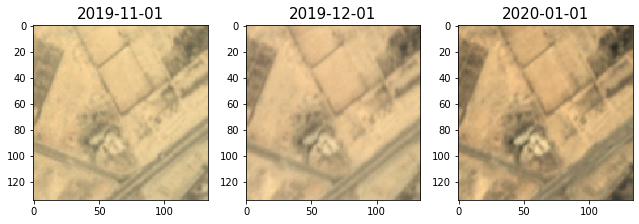

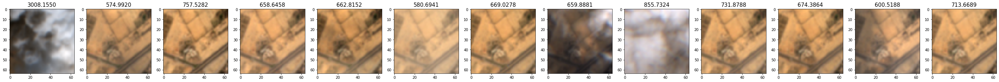

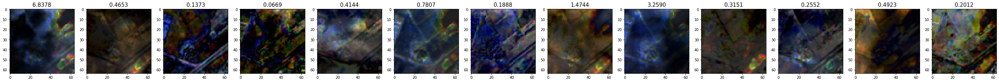

In [67]:
i = 0
P = dm.dataset_train.dataset_planet[i]
S = dm.dataset_train.dataset_sentinel[i]
img_p = P['images']
img_s = S['images']

show(img_p, title=img_p.time.to_index().astype(str))
show(img_s, title=img_s.values.std((1, 2, 3)))#, max=img_s.values.max())
# show(S['clouds'] <= 1)

q1, m, q3 = np.quantile(img_s, q=[.25, .5, .75], axis=(0))
iqr = q3 - q1
a = (q1 - 1.0*iqr).astype(int)
b = (q3 + 1.0*iqr).astype(int)
outliers = (img_s > m) * (img_s - m) / (b - m)
outliers += (img_s < m) * (m - img_s) / (m - a)
show(outliers, title=outliers.values.mean((1,2,3)))#, max=outliers.values.max())

# Distribution of colors between bands

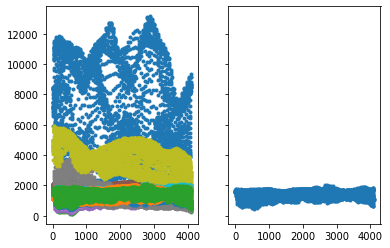

In [68]:
x = img_s.values.reshape(img_s.shape[:2] + (-1,))
m = np.median(x.T, axis=2)

b = 2
_, ax = plt.subplots(1, 2, sharey=True);
ax[0].plot(x[:, b, :].T, '.');
ax[1].plot(m[:, b], '.');

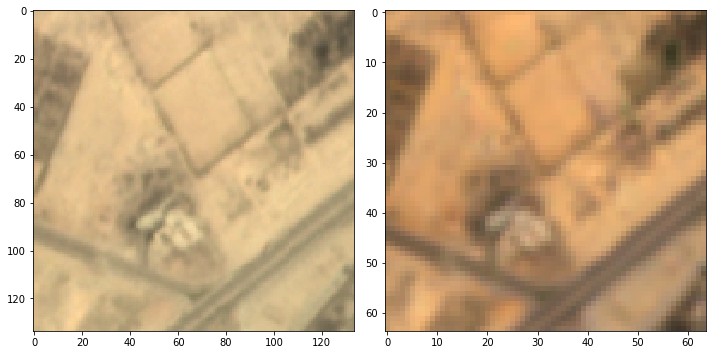

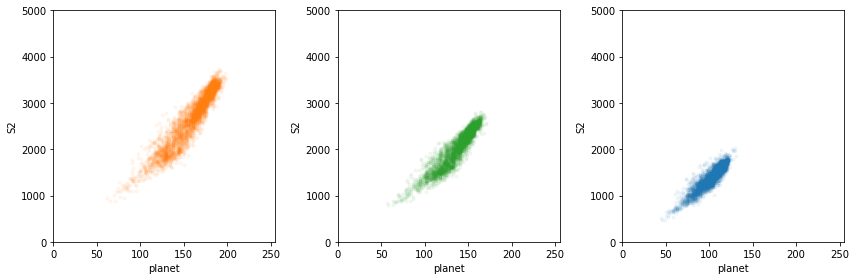

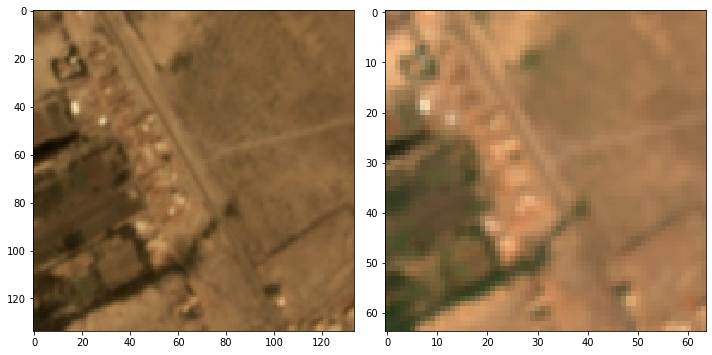

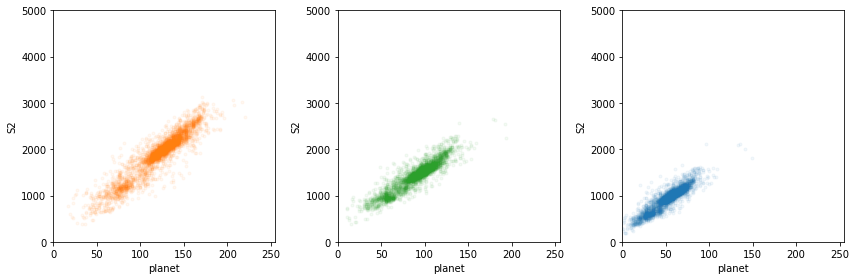

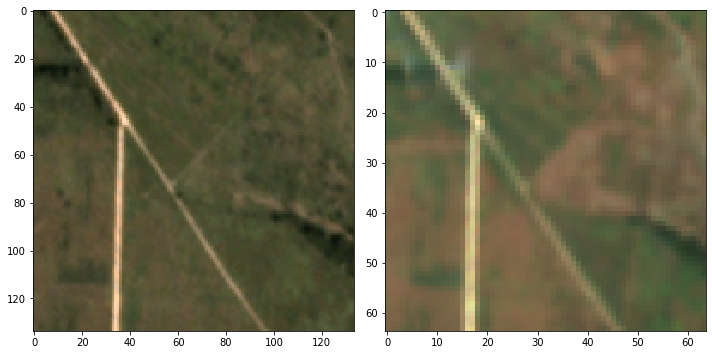

...

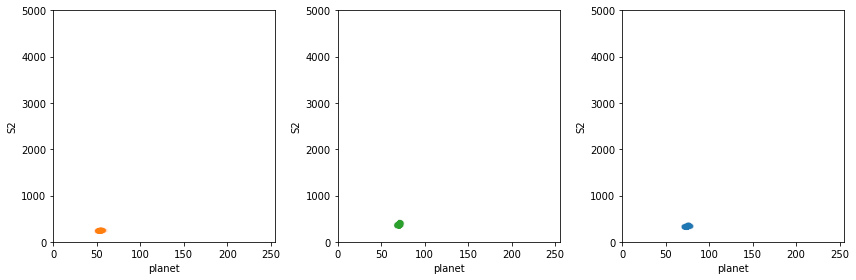

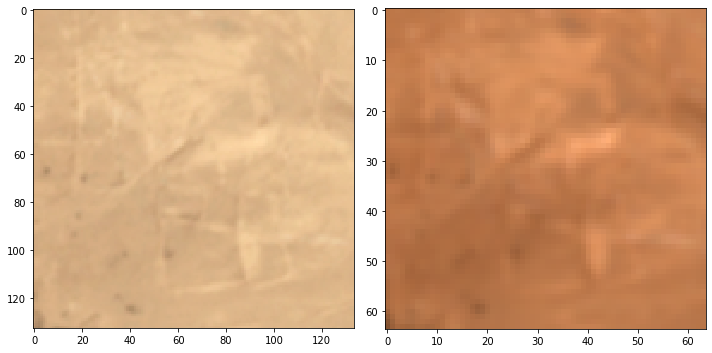

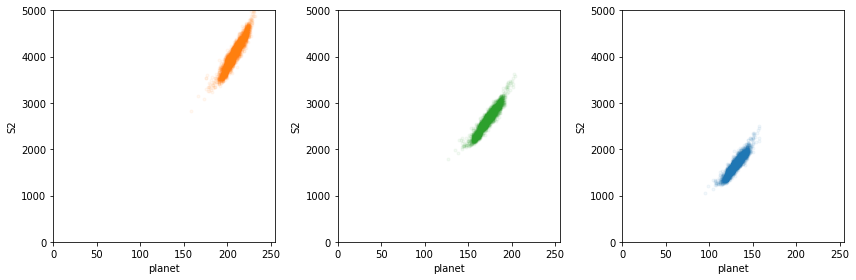

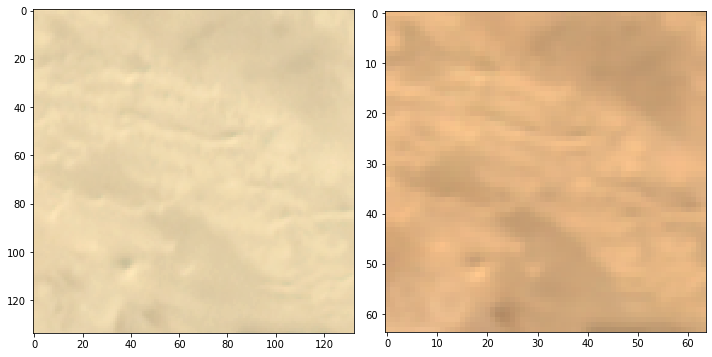

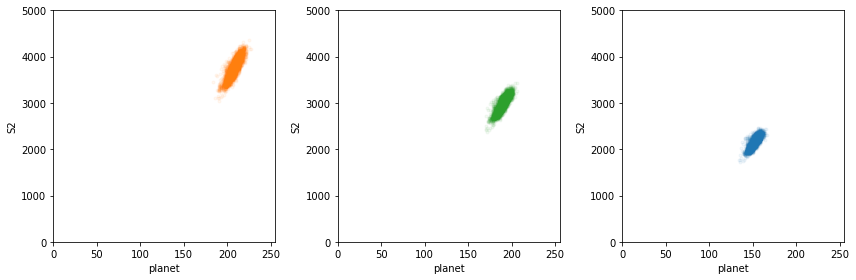

In [69]:
for item in range(10):
    img_p = dm.dataset_train.dataset_planet[item]['images'].median('time')
    img_s = dm.dataset_train.dataset_sentinel[item]['images'].median('time')
    show([img_p, img_s], figsize=5)
    template = img_s[0]  # band 0
    img_p = [x.interp_like(template, method='nearest') for x in img_p]
    _, ax = plt.subplots(1, 3, figsize=(12, 4), tight_layout=True)#, sharex=True, sharey=True)
    for c in range(3):
        x, y = img_p[c].values.ravel(), img_s[c].values.ravel()
        ax[c].scatter(x, y, marker='.', alpha=.05, c=f"C{[1,2,0][c]}")
        ax[c].set_ylim((0, 5000)), ax[c].set_xlim((0, 255))
        ax[c].set_xlabel('planet'), ax[c].set_ylabel('S2')
#     sns.pairplot(pd.DataFrame(np.concatenate((np.array([x.values.flatten() for x in img_p]).T,
#                                       img_s.values.reshape(3, -1).T), axis=1),
#                       columns=['p-R', 'p-G', 'p-B', 's2-R', 's2-G', 's2-B']),
#          x_vars=['p-R', 'p-G', 'p-B'], y_vars=['s2-R', 's2-G', 's2-B'], );